In [210]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold,cross_val_score
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import RobustScaler

In [211]:
data=pd.read_csv(r"C:\Users\sanik\Downloads\train.csv")

In [212]:
test=pd.read_csv(r"C:\Users\sanik\Downloads\test.csv")

In [213]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [214]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [215]:
data.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [216]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [217]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [218]:
data.shape

(1460, 81)

In [219]:
test.shape

(1459, 80)

In [220]:
# Store test Ids before dropping
test_ids = test['Id'].copy()

# Drop 'Id' from training and test features
data= data.drop(columns=['Id'], errors='ignore')
test = test.drop(columns=['Id'], errors='ignore')

# handle missing values

In [221]:
missing=data.isnull().sum()
missing[missing>0].sort_values(ascending=True)


Electrical         1
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
BsmtExposure      38
BsmtFinType2      38
GarageCond        81
GarageQual        81
GarageFinish      81
GarageYrBlt       81
GarageType        81
LotFrontage      259
FireplaceQu      690
MasVnrType       872
Fence           1179
Alley           1369
MiscFeature     1406
PoolQC          1453
dtype: int64

In [222]:
missing=test.isnull().sum()
missing[missing>0].sort_values(ascending=True)


TotalBsmtSF        1
GarageArea         1
GarageCars         1
KitchenQual        1
BsmtUnfSF          1
BsmtFinSF2         1
BsmtFinSF1         1
SaleType           1
Exterior1st        1
Exterior2nd        1
Functional         2
Utilities          2
BsmtHalfBath       2
BsmtFullBath       2
MSZoning           4
MasVnrArea        15
BsmtFinType1      42
BsmtFinType2      42
BsmtQual          44
BsmtExposure      44
BsmtCond          45
GarageType        76
GarageCond        78
GarageQual        78
GarageYrBlt       78
GarageFinish      78
LotFrontage      227
FireplaceQu      730
MasVnrType       894
Fence           1169
Alley           1352
MiscFeature     1408
PoolQC          1456
dtype: int64

In [223]:
data['Electrical'].ffill(inplace=True)
data['MasVnrArea'].fillna(0,inplace=True)
test['MasVnrArea'].fillna(0,inplace=True)
mode_val = data['MasVnrType'].mode()[0]
mode_val_test = test['MasVnrType'].mode()[0]

data.loc[(data['MasVnrArea'] == 0) & (data['MasVnrType'].isnull()), 'MasVnrType'] = 'None'
data.loc[(data['MasVnrArea'] != 0) & (data['MasVnrType'].isnull()), 'MasVnrType'] = mode_val
test.loc[(data['MasVnrArea'] == 0) & (test['MasVnrType'].isnull()), 'MasVnrType'] = 'None'
test.loc[(data['MasVnrArea'] != 0) & (test['MasVnrType'].isnull()), 'MasVnrType'] = mode_val_test


In [224]:
c=['Fence','Alley','MiscFeature','PoolQC']
for col in c:
    data.drop(col,axis=1,inplace=True)
    test.drop(col,axis=1,inplace=True)

In [225]:

data['LotFrontage'] = data.groupby('Neighborhood')['LotFrontage'].transform(
    lambda x: x.fillna(x.median())
)

test['LotFrontage'] = data.groupby('Neighborhood')['LotFrontage'].transform(
    lambda x: x.fillna(x.median())
)


In [226]:
for col in data.columns:
    if data[col].dtype == "object":
        data[col].fillna(data[col].mode()[0] ,inplace=True)
    else:
        data[col].fillna(data[col].mean() , inplace=True)

In [227]:
for col in test.columns:
    if test[col].dtype == "object":
        test[col].fillna(data[col].mode()[0] ,inplace=True)
    else:
        test[col].fillna(data[col].mean() , inplace=True)

In [228]:

c = ['MSSubClass', 'OverallCond', 'MoSold']

for col in c:
    data[col] = data[col].astype(str)
    test[col] = test[col].astype(str)

for col in data.select_dtypes(include='object').columns:
    data[col] = data[col].astype('category')

for col in test.select_dtypes(include='object').columns:
    test[col] = test[col].astype('category')



In [229]:
print(data.dtypes)

MSSubClass       category
MSZoning         category
LotFrontage       float64
LotArea             int64
Street           category
                   ...   
MoSold           category
YrSold              int64
SaleType         category
SaleCondition    category
SalePrice           int64
Length: 76, dtype: object


In [230]:
data.columns


Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

In [231]:
data.shape

(1460, 76)

In [232]:
test.shape

(1459, 75)

# outlier 


IQR outlier counts per column:
{'Id': 0, 'LotFrontage': 93, 'LotArea': 69, 'OverallQual': 2, 'YearBuilt': 7, 'YearRemodAdd': 0, 'MasVnrArea': 98, 'BsmtFinSF1': 7, 'BsmtFinSF2': 167, 'BsmtUnfSF': 29, 'TotalBsmtSF': 61, '1stFlrSF': 20, '2ndFlrSF': 2, 'LowQualFinSF': 26, 'GrLivArea': 31, 'BsmtFullBath': 1, 'BsmtHalfBath': 82, 'FullBath': 0, 'HalfBath': 0, 'BedroomAbvGr': 35, 'KitchenAbvGr': 68, 'TotRmsAbvGrd': 30, 'Fireplaces': 5, 'GarageYrBlt': 1, 'GarageCars': 5, 'GarageArea': 21, 'WoodDeckSF': 32, 'OpenPorchSF': 77, 'EnclosedPorch': 208, '3SsnPorch': 24, 'ScreenPorch': 116, 'PoolArea': 7, 'MiscVal': 52, 'YrSold': 0, 'SalePrice': 61}


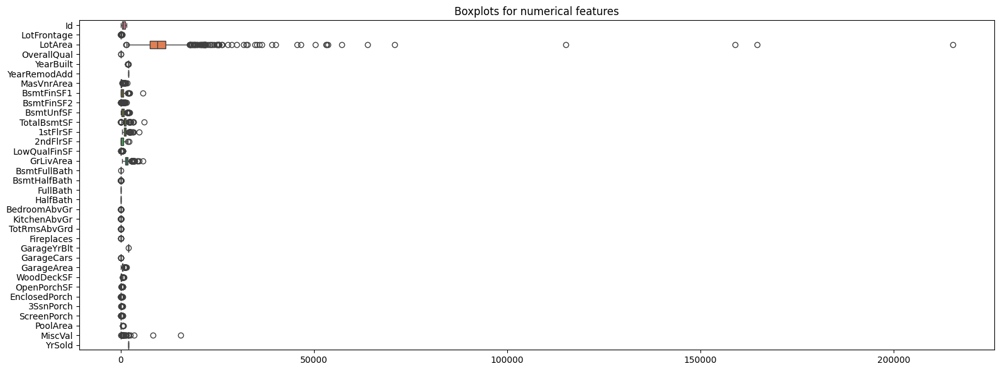

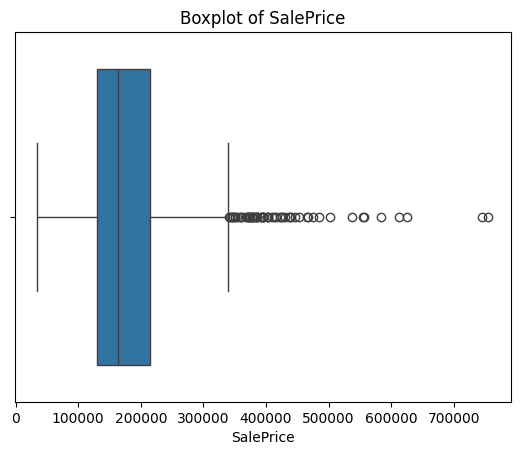

In [114]:



num_cols= data.select_dtypes(include=['number']).columns.tolist()

z_threshold = 3
z_scores = np.abs(zscore(data[num_cols].dropna()))
outliers_z = (z_scores > z_threshold)


def iqr_outliers(col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return data[(data[col] < lower) | (data[col] > upper)]

iqr_outlier_summary = {col: iqr_outliers(col).shape[0] for col in num_cols}
print("\nIQR outlier counts per column:")
print(iqr_outlier_summary)

plt.figure(figsize=(16, 6))
sns.boxplot(data=data[num_cols].drop(columns=['SalePrice']), orient='h')
plt.title("Boxplots for numerical features")
plt.tight_layout()
plt.show()

sns.boxplot(x=data['SalePrice'])
plt.title("Boxplot of SalePrice")
plt.show()


In [233]:
features_to_cap = [
    'LotFrontage', 'LotArea', 'MasVnrArea',
    'BsmtFinSF2', 'EnclosedPorch', 'OpenPorchSF',
    'ScreenPorch', 'MiscVal', 'GrLivArea', 'TotalBsmtSF'
]

def cap_outliers_quantile(data, column, lower_quantile=0.01, upper_quantile=0.99):
    lower = data[column].quantile(lower_quantile)
    upper = data[column].quantile(upper_quantile)
    data[column] = data[column].clip(lower=lower, upper=upper)
    return data

for col in features_to_cap:
    data = cap_outliers_quantile(data, col)

print("Capped top & bottom 1% of selected features.")



Capped top & bottom 1% of selected features.


In [234]:

data['SalePrice'] = np.log1p(data['SalePrice'])  # Apply before model training


In [235]:
data.shape

(1460, 76)

In [236]:
test.shape

(1459, 75)

# feature engineering

In [237]:
data['is_train'] = 1
test['is_train'] = 0

combined = pd.concat([data, test], axis=0)


In [238]:
def feature_engineering(df):
    df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
    df['TotalHouseSF'] = df['GrLivArea'] + df['TotalBsmtSF']
    df['TotalBathrooms'] = df['FullBath'] + 0.5 * df['HalfBath'] + df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']
    df['TotalPorchSF'] = df['OpenPorchSF'] + df['EnclosedPorch']

    for col in ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold', 'OverallQual', 'OverallCond']:
        df[col] = pd.to_numeric(df[col], errors='coerce')

    df['HouseAge'] = df['YrSold'] - df['YearBuilt']
    df['RemodAge'] = df['YrSold'] - df['YearRemodAdd']
    df['GarageAge'] = df['YrSold'] - df['GarageYrBlt']
    df['GarageAge'] = df['GarageAge'].fillna(df['GarageAge'].median())

    df['OverallGrade'] = df['OverallQual'] * df['OverallCond']
    df['HasPool'] = (df['PoolArea'] > 0).astype(int)
    df['HasGarage'] = (df['GarageArea'] > 0).astype(int)
    df['HasBasement'] = (df['TotalBsmtSF'] > 0).astype(int)
    df['HasFireplace'] = (df['Fireplaces'] > 0).astype(int)
    df['Has2ndFloor'] = (df['2ndFlrSF'] > 0).astype(int)

    df['GrLivArea_log'] = np.log1p(df['GrLivArea'])
    df['LotArea_log'] = np.log1p(df['LotArea'])

    return df


In [239]:
combined = feature_engineering(combined)


In [240]:
data = combined[combined['is_train'] == 1].drop(columns='is_train')
test = combined[combined['is_train'] == 0].drop(columns=['is_train', 'SalePrice'], errors='ignore')


In [241]:
data.shape

(1460, 91)

In [242]:
test.shape

(1459, 90)

# feature selection

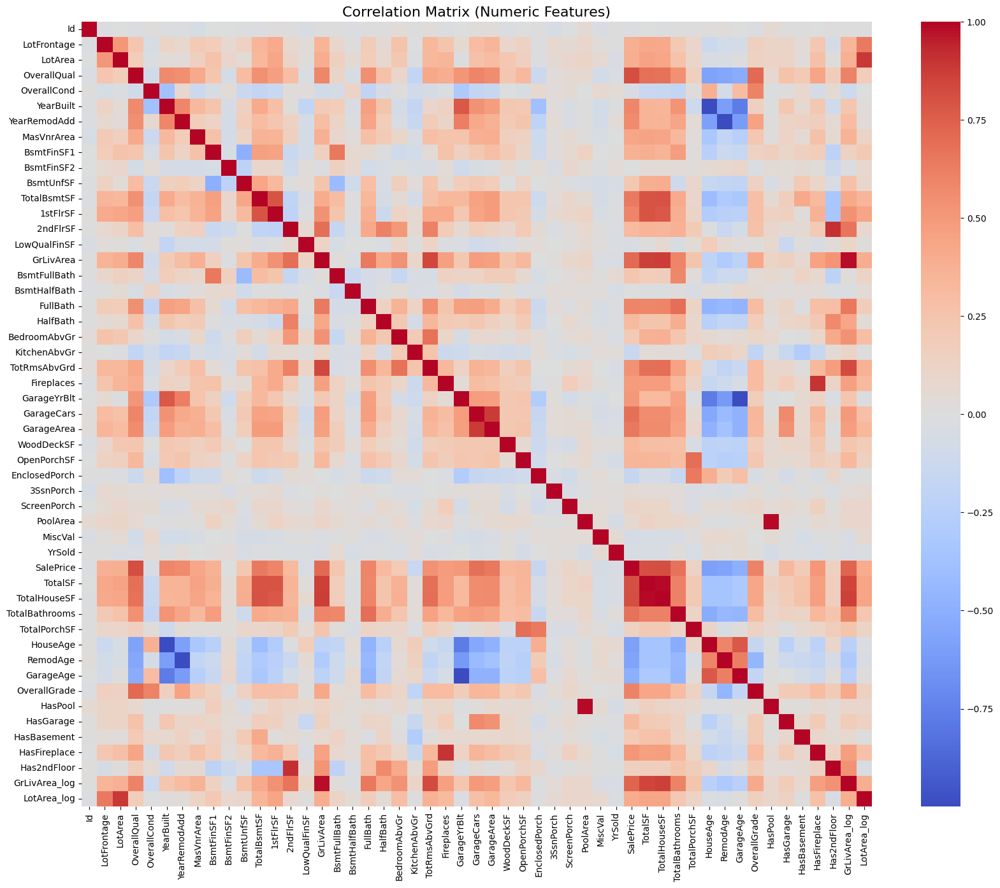

In [167]:
numeric_data = data.select_dtypes(include=[np.number])
corr_matrix = numeric_data.corr()

plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, fmt='.2f', center=0)
plt.title('Correlation Matrix (Numeric Features)', fontsize=16)
plt.show()


In [243]:
def drop_highly_correlated_features_target_based(df, target_col='SalePrice', threshold=0.9):
   
    numeric_df = df.select_dtypes(include=['number'])

    corr_matrix = numeric_df.corr().abs()

    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    to_drop = []

    for column in upper.columns:
        for row in upper.index:
            if upper.loc[row, column] > threshold:
                if corr_matrix[target_col][row] > corr_matrix[target_col][column]:
                    to_drop.append(column)
                else:
                    to_drop.append(row)

    to_drop = list(set(to_drop))
    print(f"Dropping {len(to_drop)} columns: {to_drop}")


    df = df.drop(columns=to_drop)
    return df, to_drop


In [244]:

data, dropped_cols = drop_highly_correlated_features_target_based(data, target_col='SalePrice', threshold=0.9)


test = test.drop(columns=[col for col in dropped_cols if col in test.columns])


Dropping 8 columns: ['YearRemodAdd', 'YearBuilt', 'Fireplaces', 'TotalSF', 'GrLivArea', 'GarageYrBlt', 'PoolArea', 'Has2ndFloor']


In [245]:
test.shape

(1459, 82)

In [246]:
data.shape

(1460, 83)

# encoding

In [247]:
from category_encoders import TargetEncoder

cat_cols = data.select_dtypes(include=['object', 'category']).columns


te = TargetEncoder(cols=cat_cols, smoothing=0.3)  
data[cat_cols] = te.fit_transform(data[cat_cols], data['SalePrice'])

test[cat_cols] = te.transform(test[cat_cols])


# Scaling

In [248]:


numerical_cols = data.select_dtypes(include=['int64', 'float64']).columns.drop('SalePrice')

scaler = RobustScaler()

data[numerical_cols] = scaler.fit_transform(data[numerical_cols])
test[numerical_cols] = scaler.transform(test[numerical_cols])


In [249]:

from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import IsolationForest
print(f"Original rows: {len(data)}")
iso = IsolationForest(contamination=0.01, random_state=42)
outlier_flags = iso.fit_predict(data)  


data = data[outlier_flags == 1].reset_index(drop=True)

print(f" After removing outliers: {len(data)}")


Original rows: 1460
 After removing outliers: 1445


In [250]:
y=data[['SalePrice']]

In [251]:
X=data.drop('SalePrice',axis=1)

In [252]:
X.shape

(1445, 82)

In [253]:
y.shape

(1445, 1)

In [254]:
test.shape

(1459, 82)

# Feature selection

5 features ➤ RMSE: 0.1359
10 features ➤ RMSE: 0.1206
15 features ➤ RMSE: 0.1190
20 features ➤ RMSE: 0.1157
25 features ➤ RMSE: 0.1154
30 features ➤ RMSE: 0.1165
35 features ➤ RMSE: 0.1140
40 features ➤ RMSE: 0.1126
45 features ➤ RMSE: 0.1134
50 features ➤ RMSE: 0.1118
55 features ➤ RMSE: 0.1132
60 features ➤ RMSE: 0.1133
65 features ➤ RMSE: 0.1128
70 features ➤ RMSE: 0.1125
75 features ➤ RMSE: 0.1134
80 features ➤ RMSE: 0.1136


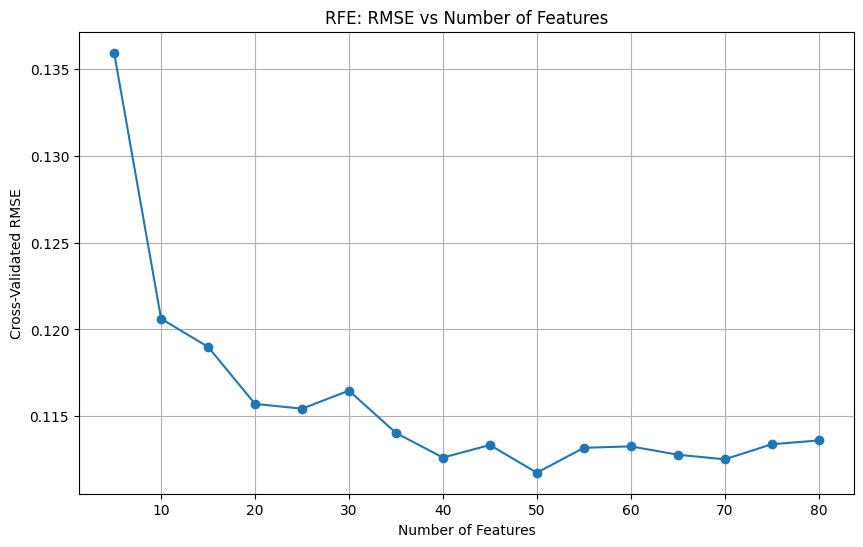

In [181]:
from sklearn.feature_selection import RFE
from catboost import CatBoostRegressor
from sklearn.metrics import make_scorer, mean_squared_error

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

rmse_scorer = make_scorer(rmse, greater_is_better=False)
model = CatBoostRegressor(
    iterations=500,
    learning_rate=0.05,
    depth=5,
    loss_function='RMSE',
    random_state=42,
    verbose=0
)
from sklearn.base import clone

results = []
feature_range = list(range(5, len(X.columns) + 1, 5))  # from 5 to total cols, step=5

for n_features in feature_range:
    rfe = RFE(estimator=clone(model), n_features_to_select=n_features, step=1)
    rfe.fit(X, y.values.ravel())
    
    selected_features = X.columns[rfe.support_]
    X_selected = X[selected_features]
    
    score = cross_val_score(clone(model), X_selected, y.values.ravel(), 
                            scoring=rmse_scorer, cv=5)
    
    mean_rmse = -np.mean(score)
    results.append((n_features, mean_rmse))
    print(f"{n_features} features ➤ RMSE: {mean_rmse:.4f}")
features, rmse_scores = zip(*results)

plt.figure(figsize=(10,6))
plt.plot(features, rmse_scores, marker='o')
plt.title('RFE: RMSE vs Number of Features')
plt.xlabel('Number of Features')
plt.ylabel('Cross-Validated RMSE')
plt.grid(True)
plt.show()


In [ ]:
 ## RFE

In [255]:
from sklearn.feature_selection import RFE
from lightgbm import LGBMRegressor


model = LGBMRegressor(n_estimators=100, random_state=42)


rfe = RFE(estimator=model, n_features_to_select=50, step=1)
rfe.fit(X, y)


selected_features = X.columns[rfe.support_].tolist()
print(f"Selected {len(selected_features)} features:\n", selected_features)


X = X[selected_features]
test= test[selected_features]  


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4002
[LightGBM] [Info] Number of data points in the train set: 1445, number of used features: 78
[LightGBM] [Info] Start training from score 12.025270
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3747
[LightGBM] [Info] Number of data points in the train set: 1445, number of used features: 77
[LightGBM] [Info] Start training from score 12.025270
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3744
[LightGBM] [Info] Number of data points in the train set: 1445, number of used features: 76
[LightGBM] [Info] Start trai

In [256]:
X.shape

(1445, 50)

In [257]:
y.shape

(1445, 1)

In [258]:
test.shape

(1459, 50)

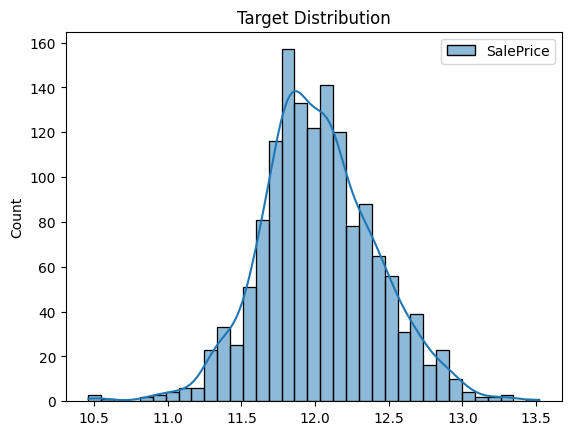

In [259]:


sns.histplot(y, kde=True)
plt.title('Target Distribution')
plt.show()


# Model selection

In [333]:
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# Define models
models = {
    'RandomForest': RandomForestRegressor(max_depth=8, n_jobs=-1, random_state=42),
    'XGBoost': XGBRegressor(max_depth=8, n_jobs=-1, random_state=42),
    'LightGBM': LGBMRegressor(max_depth=8, n_jobs=-1, random_state=42),
    'Ridge': Ridge(alpha=1.0),
    'Lasso': Lasso(alpha=0.01),
    'CatBoost': CatBoostRegressor(verbose=0, depth=8, random_state=42)
}

# Store results
results = {
    name: {
        'train_r2': [],
        'test_r2': [],
        'mae': [],
        'rmse': []
    } for name in models
}

# K-Fold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print(f"\nFold {fold + 1}")

    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

    # Scale features (CatBoost can handle unscaled but we keep it uniform)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    for name, model in models.items():
        # CatBoost doesn't need scaling but we keep same flow
        model.fit(X_train_scaled, y_train)

        y_train_pred = model.predict(X_train_scaled)
        y_val_pred = model.predict(X_val_scaled)

        # Metrics
        train_r2 = r2_score(y_train, y_train_pred)
        test_r2 = r2_score(y_val, y_val_pred)
        mae = mean_absolute_error(y_val, y_val_pred)
        rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

        results[name]['train_r2'].append(train_r2)
        results[name]['test_r2'].append(test_r2)
        results[name]['mae'].append(mae)
        results[name]['rmse'].append(rmse)

        print(f"{name} — R²: {test_r2:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}")

# Final average results
results_df = pd.DataFrame({
    model: pd.DataFrame(metrics).mean() for model, metrics in results.items()
}).T

print("\nAverage CV Results:")
print(results_df)



Fold 1
RandomForest — R²: 0.8784, MAE: 0.0976, RMSE: 0.1490
XGBoost — R²: 0.8551, MAE: 0.1086, RMSE: 0.1627
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3352
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

In [334]:
import optuna


def objective(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 500, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'depth': trial.suggest_int('depth', 4, 10),
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 10),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 1.0),
        'random_strength': trial.suggest_int('random_strength', 1, 20),
        'verbose': 0
    }

    model = CatBoostRegressor(**params, random_state=42)
    score = cross_val_score(
        model, X, y,
        scoring='neg_root_mean_squared_error',
        cv=5,
        n_jobs=-1
    )

    return -np.mean(score)

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=30)

print("Best params:", study.best_params)
print("Best RMSE:", study.best_value)


[I 2025-07-09 20:06:11,891] A new study created in memory with name: no-name-20261cef-b7bb-4e2c-bed3-86828c5318de
[I 2025-07-09 20:07:51,239] Trial 0 finished with value: 0.11371932476142269 and parameters: {'iterations': 1386, 'learning_rate': 0.05607393547307881, 'depth': 7, 'l2_leaf_reg': 5, 'bagging_temperature': 0.5875705776248717, 'random_strength': 2}. Best is trial 0 with value: 0.11371932476142269.
[I 2025-07-09 20:09:19,928] Trial 1 finished with value: 0.11553083571343004 and parameters: {'iterations': 1007, 'learning_rate': 0.05164515571556209, 'depth': 7, 'l2_leaf_reg': 6, 'bagging_temperature': 0.5778609211242229, 'random_strength': 14}. Best is trial 0 with value: 0.11371932476142269.
[I 2025-07-09 20:10:02,382] Trial 2 finished with value: 0.11383455474590172 and parameters: {'iterations': 1119, 'learning_rate': 0.09782815830702511, 'depth': 5, 'l2_leaf_reg': 10, 'bagging_temperature': 0.11160909788098339, 'random_strength': 18}. Best is trial 0 with value: 0.1137193247

Best params: {'iterations': 1322, 'learning_rate': 0.04286691392029824, 'depth': 4, 'l2_leaf_reg': 9, 'bagging_temperature': 0.712531388640322, 'random_strength': 5}
Best RMSE: 0.11078314035118128


In [215]:
X.duplicated().sum()

np.int64(0)

In [ ]:
# {'iterations': 1364, 'learning_rate': 0.02498561969609884, 'depth': 5, 'l2_leaf_reg': 3, 'bagging_temperature': 0.3276253628765046, 'random_strength': 5}

In [ ]:
#{'iterations': 858, 'learning_rate': 0.03989898234129616, 'depth': 4, 'l2_leaf_reg': 3, 'bagging_temperature': 0.4624332800393609, 'random_strength': 13}

In [335]:



kf = KFold(n_splits=5, shuffle=True, random_state=42)

oof_preds = np.zeros(len(X))


params = {'iterations': 1322, 'learning_rate': 0.04286691392029824, 'depth': 4, 'l2_leaf_reg': 9, 'bagging_temperature': 0.712531388640322, 'random_strength': 5}

for fold, (train_idx, valid_idx) in enumerate(kf.split(X, y)):
    print(f"\n🔁 Fold {fold + 1}")
    
    X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
    y_train, y_valid = y.iloc[train_idx], y.iloc[valid_idx]
    
    model = CatBoostRegressor(**params)
    model.fit(X_train, y_train, eval_set=(X_valid, y_valid), early_stopping_rounds=50)
    
    oof_preds[valid_idx] = model.predict(X_valid)
    
    fold_rmse_log = np.sqrt(mean_squared_error(y_valid, oof_preds[valid_idx]))
    print(f" Fold {fold + 1} RMSE (log): {fold_rmse_log:.5f}")


overall_rmse_log = np.sqrt(mean_squared_error(y, oof_preds))
print(f"\n Overall CV RMSE (log): {overall_rmse_log:.5f}")


y_true_actual = np.expm1(y)
y_pred_actual = np.expm1(oof_preds)


actual_rmse = np.sqrt(mean_squared_error(y_true_actual, y_pred_actual))
print(f"Overall CV RMSE (original scale): {actual_rmse:.3f}")



🔁 Fold 1
0:	learn: 0.3735324	test: 0.4207870	best: 0.4207870 (0)	total: 5.59ms	remaining: 7.39s
1:	learn: 0.3662278	test: 0.4133576	best: 0.4133576 (1)	total: 11.2ms	remaining: 7.42s
2:	learn: 0.3588210	test: 0.4057449	best: 0.4057449 (2)	total: 16.9ms	remaining: 7.43s
3:	learn: 0.3503712	test: 0.3970543	best: 0.3970543 (3)	total: 22.4ms	remaining: 7.37s
4:	learn: 0.3433359	test: 0.3898096	best: 0.3898096 (4)	total: 28.2ms	remaining: 7.42s
5:	learn: 0.3363981	test: 0.3825004	best: 0.3825004 (5)	total: 33.8ms	remaining: 7.42s
6:	learn: 0.3292756	test: 0.3757323	best: 0.3757323 (6)	total: 38.9ms	remaining: 7.3s
7:	learn: 0.3224917	test: 0.3685678	best: 0.3685678 (7)	total: 43.1ms	remaining: 7.07s
8:	learn: 0.3152771	test: 0.3611334	best: 0.3611334 (8)	total: 49.5ms	remaining: 7.22s
9:	learn: 0.3096471	test: 0.3557414	best: 0.3557414 (9)	total: 55ms	remaining: 7.21s
10:	learn: 0.3035606	test: 0.3493124	best: 0.3493124 (10)	total: 60.8ms	remaining: 7.25s
11:	learn: 0.2975571	test: 0.34321

In [332]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import RidgeCV


base_models = [
    ('cat', CatBoostRegressor(iterations=1364, learning_rate=0.025, depth=5,
                               l2_leaf_reg=3, bagging_temperature=0.33,
                               random_strength=5, loss_function='RMSE',
                               verbose=0, random_state=42)),
    ('xgb', XGBRegressor(n_estimators=1000, learning_rate=0.05,
                         max_depth=5, n_jobs=-1, random_state=42)),
    ('lgbm', LGBMRegressor(n_estimators=1000, learning_rate=0.05,
                           max_depth=5, random_state=42))
]

# Meta-model (stacker)
meta_model = RidgeCV()

# Stacking Regressor
stacked_model = StackingRegressor(
    estimators=base_models,
    final_estimator=meta_model,
    cv=5,
    n_jobs=-1,
    passthrough=True
)

# Cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)
oof_preds = np.zeros(len(X))

for fold, (train_idx, valid_idx) in enumerate(kf.split(X, y)):
    print(f"\n Fold {fold+1}")
    X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
    y_train, y_valid = y.iloc[train_idx], y.iloc[valid_idx]

    stacked_model.fit(X_train, y_train)
    preds = stacked_model.predict(X_valid)
    oof_preds[valid_idx] = preds

    rmse_log = np.sqrt(mean_squared_error(y_valid, preds))
    print(f" Fold {fold+1} RMSE (log): {rmse_log:.5f}")

# Overall RMSE (log scale)
overall_log_rmse = np.sqrt(mean_squared_error(y, oof_preds))
print(f"\n Overall CV RMSE (log): {overall_log_rmse:.5f}")

# Convert predictions back to original scale
y_true_original = np.expm1(y)
y_pred_original = np.expm1(oof_preds)
rmse_original = np.sqrt(mean_squared_error(y_true_original, y_pred_original))
print(f" Overall CV RMSE (original scale): {rmse_original:.2f}")



🔁 Fold 1
✅ Fold 1 RMSE (log): 0.13293

🔁 Fold 2
✅ Fold 2 RMSE (log): 0.08847

🔁 Fold 3
✅ Fold 3 RMSE (log): 0.11071

🔁 Fold 4
✅ Fold 4 RMSE (log): 0.10264

🔁 Fold 5
✅ Fold 5 RMSE (log): 0.12461

📌 Overall CV RMSE (log): 0.11298
💰 Overall CV RMSE (original scale): 21016.38


In [336]:
import optuna
from lightgbm import LGBMRegressor
from sklearn.model_selection import KFold, cross_val_score
import numpy as np


def objective_lgbm(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 1500),
        'max_depth': trial.suggest_int('max_depth', 3, 8),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 50),
        'random_state': 42,
        'n_jobs': -1
    }

    model = LGBMRegressor(**params)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    
    scores = cross_val_score(model, X, y, cv=kf, scoring='neg_root_mean_squared_error')
    return -scores.mean()


study_lgbm = optuna.create_study(direction='minimize')
study_lgbm.optimize(objective_lgbm, n_trials=30, show_progress_bar=True)


print(" Best LightGBM Params:")
print(study_lgbm.best_params)


[I 2025-07-09 20:55:49,340] A new study created in memory with name: no-name-f4cd0b7a-129b-40ad-87e4-53a5ac25ad6b
  0%|                                                                                           | 0/30 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, 

Best trial: 0. Best value: 0.122957:   3%|█▌                                            | 1/30 [00:23<11:15, 23.28s/it]

[I 2025-07-09 20:56:12,619] Trial 0 finished with value: 0.12295660147200208 and parameters: {'n_estimators': 1117, 'max_depth': 6, 'learning_rate': 0.026318069118500258, 'subsample': 0.6281236842269737, 'colsample_bytree': 0.6050965533008822, 'reg_alpha': 1.459917703052489, 'reg_lambda': 0.7409614447399987, 'min_child_samples': 25}. Best is trial 0 with value: 0.12295660147200208.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

Best trial: 0. Best value: 0.122957:   7%|███                                           | 2/30 [00:31<06:51, 14.69s/it]

[I 2025-07-09 20:56:21,292] Trial 1 finished with value: 0.12915378414397832 and parameters: {'n_estimators': 1291, 'max_depth': 4, 'learning_rate': 0.1261689693314229, 'subsample': 0.6611885191813982, 'colsample_bytree': 0.6691389622356604, 'reg_alpha': 2.6937752277176856, 'reg_lambda': 0.4528733887616515, 'min_child_samples': 38}. Best is trial 0 with value: 0.12295660147200208.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

Best trial: 0. Best value: 0.122957:  10%|████▌                                         | 3/30 [00:40<05:17, 11.77s/it]

[I 2025-07-09 20:56:29,574] Trial 2 finished with value: 0.12598083596072218 and parameters: {'n_estimators': 661, 'max_depth': 6, 'learning_rate': 0.15475453104830236, 'subsample': 0.7228483683266815, 'colsample_bytree': 0.9069787545274067, 'reg_alpha': 0.8472277093471825, 'reg_lambda': 1.4502543963130972, 'min_child_samples': 15}. Best is trial 0 with value: 0.12295660147200208.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

Best trial: 0. Best value: 0.122957:  13%|██████▏                                       | 4/30 [00:55<05:43, 13.23s/it]

[I 2025-07-09 20:56:45,061] Trial 3 finished with value: 0.12621603313999166 and parameters: {'n_estimators': 637, 'max_depth': 5, 'learning_rate': 0.16561793126917898, 'subsample': 0.7623114787219708, 'colsample_bytree': 0.7032133886510232, 'reg_alpha': 0.1397466547573517, 'reg_lambda': 0.23649965918869698, 'min_child_samples': 16}. Best is trial 0 with value: 0.12295660147200208.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

Best trial: 0. Best value: 0.122957:  17%|███████▋                                      | 5/30 [00:59<04:05,  9.83s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Best trial: 0. Best value: 0.122957:  20%|█████████▏                                    | 6/30 [01:05<03:26,  8.62s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Best trial: 0. Best value: 0.122957:  23%|██████████▋                                   | 7/30 [01:14<03:17,  8.58s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Best trial: 0. Best value: 0.122957:  27%|████████████▎                                 | 8/30 [01:22<03:04,  8.39s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Best trial: 8. Best value: 0.122421:  30%|█████████████▊                                | 9/30 [02:08<07:03, 20.19s/it]

[I 2025-07-09 20:57:57,733] Trial 8 finished with value: 0.12242061632530143 and parameters: {'n_estimators': 805, 'max_depth': 8, 'learning_rate': 0.02437972712457864, 'subsample': 0.6203234745571725, 'colsample_bytree': 0.7761046994355472, 'reg_alpha': 0.45483059349633814, 'reg_lambda': 3.5182873878086687, 'min_child_samples': 19}. Best is trial 8 with value: 0.12242061632530143.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

Best trial: 12. Best value: 0.121827:  47%|████████████████████▌                       | 14/30 [04:47<09:27, 35.49s/it]

[I 2025-07-09 21:00:37,072] Trial 13 finished with value: 0.12443689604761317 and parameters: {'n_estimators': 832, 'max_depth': 7, 'learning_rate': 0.055985303469508654, 'subsample': 0.6902742991060582, 'colsample_bytree': 0.7395293610960805, 'reg_alpha': 0.03783946147346001, 'reg_lambda': 3.6887955387772378, 'min_child_samples': 10}. Best is trial 12 with value: 0.12182733898981728.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

Best trial: 12. Best value: 0.121827:  50%|██████████████████████                      | 15/30 [05:05<07:31, 30.11s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Best trial: 12. Best value: 0.121827:  53%|███████████████████████▍                    | 16/30 [05:24<06:15, 26.79s/it]

[I 2025-07-09 21:01:13,805] Trial 15 finished with value: 0.12753689199461982 and parameters: {'n_estimators': 1427, 'max_depth': 7, 'learning_rate': 0.033775565655169766, 'subsample': 0.8185122692756269, 'colsample_bytree': 0.9812805278125487, 'reg_alpha': 2.1565589331172133, 'reg_lambda': 3.9070388111655303, 'min_child_samples': 30}. Best is trial 12 with value: 0.12182733898981728.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002791 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

Best trial: 12. Best value: 0.121827:  57%|████████████████████████▉                   | 17/30 [05:32<04:36, 21.27s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Best trial: 12. Best value: 0.121827:  60%|██████████████████████████▍                 | 18/30 [05:59<04:34, 22.86s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Best trial: 24. Best value: 0.121437:  90%|███████████████████████████████████████▌    | 27/30 [08:11<00:54, 18.03s/it]

[I 2025-07-09 21:04:00,579] Trial 26 finished with value: 0.12171755933779256 and parameters: {'n_estimators': 996, 'max_depth': 5, 'learning_rate': 0.059703132048122526, 'subsample': 0.7129307014758378, 'colsample_bytree': 0.6004238743036573, 'reg_alpha': 0.4982210146852551, 'reg_lambda': 3.907944898426067, 'min_child_samples': 22}. Best is trial 24 with value: 0.12143726920881588.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004369 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

Best trial: 24. Best value: 0.121437:  93%|█████████████████████████████████████████   | 28/30 [08:20<00:30, 15.31s/it]

[I 2025-07-09 21:04:09,524] Trial 27 finished with value: 0.12606882906090458 and parameters: {'n_estimators': 998, 'max_depth': 5, 'learning_rate': 0.06112989326279198, 'subsample': 0.7872206575275276, 'colsample_bytree': 0.6029418900911441, 'reg_alpha': 2.230739504389498, 'reg_lambda': 4.061828219281976, 'min_child_samples': 33}. Best is trial 24 with value: 0.12143726920881588.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3341
[LightGBM] [Info] Number of data points in the train set: 1156, number of used features: 50
[LightGBM] [Info] Start training from score 12.028844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

Best trial: 24. Best value: 0.121437:  97%|██████████████████████████████████████████▌ | 29/30 [08:29<00:13, 13.48s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

Best trial: 24. Best value: 0.121437: 100%|████████████████████████████████████████████| 30/30 [08:37<00:00, 17.24s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

In [ ]:
# {'n_estimators': 996, 'max_depth': 7, 'learning_rate': 0.09596679428609137, 'subsample': 0.6534528778012029, 'colsample_bytree': 0.6353716824349556, 'reg_alpha': 1.1275533050225628, 'reg_lambda': 3.6459788120758856, 'min_child_samples': 44}

In [187]:
from sklearn.ensemble import StackingRegressor


cat_model = CatBoostRegressor(
    iterations=1322,
    learning_rate=0.04286691392029824,
    depth=4,
    l2_leaf_reg=9,
    bagging_temperature=0.712531388640322,
    random_strength=5,
    loss_function='RMSE',
    verbose=0,
    random_state=42
)

lgbm_model = LGBMRegressor(
    n_estimators=996,
    max_depth=7,
    learning_rate=0.09596679428609137,
    subsample=0.6534528778012029,
    colsample_bytree=0.6353716824349556,
    reg_alpha=1.1275533050225628,
    reg_lambda=3.6459788120758856,
    min_child_samples=44,
    random_state=42
)

ridge_base = RidgeCV(alphas=np.logspace(-4, 4, 50), cv=5)



meta_model = RidgeCV(alphas=np.logspace(-4, 4, 50), scoring='neg_mean_squared_error', cv=5)



stacking_model = StackingRegressor(
    estimators=[
        ('cat', cat_model),
        ('lgbm', lgbm_model),
        ('ridge', ridge_base)
    ],
    final_estimator=meta_model,
    passthrough=True,
    cv=5,
    n_jobs=-1
)


kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(stacking_model, X, y, scoring='neg_root_mean_squared_error', cv=kf)

print("\n Average CV RMSE (stacked with Ridge base):", -np.mean(cv_scores))



 Average CV RMSE (stacked with Ridge base): 0.11036536640571308


In [188]:


# --- Base models ---
cat_model = CatBoostRegressor(
    iterations=1322,
    learning_rate=0.04286691392029824,
    depth=4,
    l2_leaf_reg=9,
    bagging_temperature=0.712531388640322,
    random_strength=5,
    loss_function='RMSE',
    verbose=0,
    random_state=42
)

lgbm_model = LGBMRegressor(
    n_estimators=996,
    max_depth=7,
    learning_rate=0.09596679428609137,
    subsample=0.6534528778012029,
    colsample_bytree=0.6353716824349556,
    reg_alpha=1.1275533050225628,
    reg_lambda=3.6459788120758856,
    min_child_samples=44,
    random_state=42
)

ridge_base = RidgeCV(alphas=np.logspace(-4, 4, 50), cv=5)

lasso_base = LassoCV(alphas=np.logspace(-4, 4, 50), cv=5, random_state=42, max_iter=10000)

# --- Meta model ---
meta_model = RidgeCV(alphas=np.logspace(-4, 4, 50), scoring='neg_mean_squared_error', cv=5)

# --- Stacking model ---
stacking_model = StackingRegressor(
    estimators=[
        ('cat', cat_model),
        ('lgbm', lgbm_model),
        ('ridge', ridge_base),
        ('lasso', lasso_base)  # Added Lasso as base learner
    ],
    final_estimator=meta_model,
    passthrough=True,
    cv=5,
    n_jobs=-1
)

# --- Cross-validation ---
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(stacking_model, X, y, scoring='neg_root_mean_squared_error', cv=kf)

print("\nAverage CV RMSE (stacked with Ridge base + Lasso):", -np.mean(cv_scores))



Average CV RMSE (stacked with Ridge base + Lasso): 0.11003399610733884


In [189]:
import optuna


def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 500, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
        'random_state': 42,
        'tree_method': 'hist'  # Faster on large datasets
    }

    model = XGBRegressor(**params)
    
    score = cross_val_score(
        model, X, y,
        scoring='neg_root_mean_squared_error',
        cv=5,
        n_jobs=-1
    )

    return -np.mean(score)

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=30)

print("Best params:", study.best_params)
print("Best RMSE:", study.best_value)


[I 2025-08-13 16:18:59,323] A new study created in memory with name: no-name-dd46a4a6-2372-4d3e-8b71-53291974fdfd
[I 2025-08-13 16:19:00,845] Trial 0 finished with value: 0.18709347248077393 and parameters: {'n_estimators': 608, 'learning_rate': 0.1197954298176173, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.6851585890386669, 'colsample_bytree': 0.7091494255794876, 'gamma': 4.3751816507394095, 'reg_alpha': 1.5026518291676383, 'reg_lambda': 1.0991628258492836}. Best is trial 0 with value: 0.18709347248077393.
[I 2025-08-13 16:19:02,101] Trial 1 finished with value: 0.1724816679954529 and parameters: {'n_estimators': 1082, 'learning_rate': 0.2771619961531002, 'max_depth': 5, 'min_child_weight': 6, 'subsample': 0.6926284921564798, 'colsample_bytree': 0.5013534613678796, 'gamma': 2.6090283852495544, 'reg_alpha': 2.3829368116385585, 'reg_lambda': 1.9020593081322241}. Best is trial 1 with value: 0.1724816679954529.
[I 2025-08-13 16:19:07,048] Trial 2 finished with value: 0.18548332

Best params: {'n_estimators': 513, 'learning_rate': 0.024207270276890507, 'max_depth': 9, 'min_child_weight': 10, 'subsample': 0.501180717683107, 'colsample_bytree': 0.6611009859158097, 'gamma': 0.03207214238498901, 'reg_alpha': 0.01184505700887084, 'reg_lambda': 4.9303335065308875}
Best RMSE: 0.11386431306600571


In [190]:

# --- Base Models ---
cat_model = CatBoostRegressor(
    iterations=1322,
    learning_rate=0.04286691392029824,
    depth=4,
    l2_leaf_reg=9,
    bagging_temperature=0.712531388640322,
    random_strength=5,
    loss_function='RMSE',
    verbose=0,
    random_state=42
)

lgbm_model = LGBMRegressor(
    n_estimators=996,
    max_depth=7,
    learning_rate=0.09596679428609137,
    subsample=0.6534528778012029,
    colsample_bytree=0.6353716824349556,
    reg_alpha=1.1275533050225628,
    reg_lambda=3.6459788120758856,
    min_child_samples=44,
    random_state=42
)

xgb_model = XGBRegressor(
    n_estimators=513,
    learning_rate=0.024207270276890507,
    max_depth=9,
    min_child_weight=10,
    subsample=0.501180717683107,
    colsample_bytree=0.6611009859158097,
    gamma=0.03207214238498901,
    reg_alpha=0.01184505700887084,
    reg_lambda=4.9303335065308875,
    random_state=42,
    tree_method='hist'
)

ridge_base = RidgeCV(alphas=np.logspace(-4, 4, 50), cv=5)
lasso_base = LassoCV(alphas=np.logspace(-4, 4, 50), cv=5, random_state=42)

# Meta Model
meta_model = RidgeCV(alphas=np.logspace(-4, 4, 50), scoring='neg_mean_squared_error', cv=5)

# --- Stacking Regressor ---
stacking_model = StackingRegressor(
    estimators=[
        ('cat', cat_model),
        ('lgbm', lgbm_model),
        ('xgb', xgb_model),
        ('ridge', ridge_base),
        ('lasso', lasso_base)
    ],
    final_estimator=meta_model,
    passthrough=True,
    cv=5,
    n_jobs=-1
)

# --- Cross-Validation ---
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(stacking_model, X, y, scoring='neg_root_mean_squared_error', cv=kf)

print("\nAverage CV RMSE (stacked with CatBoost + LGBM + XGB + Ridge + Lasso):", -np.mean(cv_scores))



Average CV RMSE (stacked with CatBoost + LGBM + XGB + Ridge + Lasso): 0.1096672207700304


In [191]:
from sklearn.linear_model import ElasticNetCV

meta_model_enet = ElasticNetCV(
    l1_ratio=[0.1, 0.3, 0.5, 0.7, 0.9, 1.0],  # range of L1/L2 mixing
    alphas=np.logspace(-4, 4, 50),            # range of regularization strengths
    cv=5,
    random_state=42
)

stacking_model_enet = StackingRegressor(
    estimators=[
        ('cat', cat_model),
        ('lgbm', lgbm_model),
        ('xgb', xgb_model),
        ('ridge', ridge_base),
        ('lasso', lasso_base)
    ],
    final_estimator=meta_model_enet,
    passthrough=True,
    cv=5,
    n_jobs=-1
)

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores_enet = cross_val_score(stacking_model_enet, X, y, scoring='neg_root_mean_squared_error', cv=kf)
print("\nAverage CV RMSE (ElasticNet meta):", -np.mean(cv_scores_enet))



Average CV RMSE (ElasticNet meta): 0.10955158636073406


# Final Model Trainig

In [260]:


# 2. Define the meta-model
meta_model_enet = ElasticNetCV(
    l1_ratio=[0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
    alphas=np.logspace(-4, 4, 50),
    cv=5,
    random_state=42
)

# 3. Define the stacking model with base models
stacking_model_enet = StackingRegressor(
    estimators=[
        ('cat', cat_model),
        ('lgbm', lgbm_model),
        ('xgb', xgb_model),
        ('ridge', ridge_base),
        ('lasso', lasso_base)
    ],
    final_estimator=meta_model_enet,
    passthrough=True,
    cv=5,
    n_jobs=-1
)

stacking_model_enet.fit(X, y)

# 6. Predict on test set
y_pred = stacking_model_enet.predict(test) 
y_pred = np.expm1(y_pred)
# 7. If for Kaggle submission
submission = pd.DataFrame({
    'Id': test_ids,  
    'SalePrice': y_pred
})

submission.to_csv('kaggle_submission.csv', index=False)
print("Submission file created!")


Submission file created!


In [264]:
submission.head(100)

,Id,SalePrice
0,1461,117011.796306
1,1462,163902.180778
2,1463,181262.062113
3,1464,193364.082792
4,1465,187772.485394
...,...,...
95,1556,93755.512189
96,1557,106618.260460
97,1558,97626.548115
98,1559,77715.690208
